# Tutorial : Four-point lift  - Part 2

In this example we will create a four-point lift.

We will do this in the proper way:

Assemble the information:

1. Create a lifted-object asset
2. Create a padeye asset
3. Create new scene, 
4. import the lifted object asset, 
5. import the padeye asset 4x and attach them to the lifted object
6. Save as a ready-to-be-lifted asset

**Design:**

7. Start a new scene for modelling the lift
8. import the pre-made hook asset and ready-to-be-lifted asset
9. define the rigging
10. solve and analyze



## Step 0

These two lines are always the same. They basically load the program.


In [1]:
from DAVE import *
from DAVE.jupyter import *


Equilibrium-core version = 1.0
default resource folders:
C:\Users\beneden\Miniconda3\envs\DAVE\lib\site-packages\DAVE\resources
C:\Users\beneden\DAVE_models
Blender found at: C:\Program Files\Blender Foundation\Blender 2.83\blender.exe
embedWindow(verbose=True): could not load k3d module, try:
> pip install k3d      # and if necessary:
> conda install nodejs


# Create a lifting scene

In [2]:
s = Scene()

In [3]:
s.load_scene('crane block 4p')

Loading C:\Users\beneden\Miniconda3\envs\DAVE\lib\site-packages\DAVE\resources\crane block 4p.dave


In [4]:
s.import_scene('ready_to_be_lifted')  # no need to pre-fix

Loading C:\Users\beneden\DAVE_models\ready_to_be_lifted.dave


import_container <'DAVE.scene.Axis>

Using "import_scene" without "containerize=False" will place all nodes from "ready_to_be_lifted" in an import_container. This is clearly visible when printing the node-tree:

In [5]:
s.print_node_tree()

Upper block [RigidBody]
 |-> Lower block [RigidBody]
 |    |-> hook4p [RigidBody]
 |    |    |-> prong1 [Point]
 |    |    |-> prong2 [Point]
 |    |    |-> prong3 [Point]
 |    |    |-> prong4 [Point]
 |    |    |-> Visual [Visual]
 |    |    |-> prong1_axis [Axis]
 |    |    |    |-> prong1_sheave_att [Axis]
 |    |    |    |    |-> prong1_sheave_poi [Point]
 |    |    |    |    |    |-> prong1_sheave [Circle]
 |    |    |-> prong3_axis [Axis]
 |    |    |    |-> prong3_sheave_att [Axis]
 |    |    |    |    |-> prong3_sheave_poi [Point]
 |    |    |    |    |    |-> prong3_sheave [Circle]
 |    |    |-> prong2_axis [Axis]
 |    |    |    |-> prong2_sheave_att [Axis]
 |    |    |    |    |-> prong2_sheave_poi [Point]
 |    |    |    |    |    |-> prong2_sheave [Circle]
 |    |    |-> prong4_axis [Axis]
 |    |    |    |-> prong4_sheave_att [Axis]
 |    |    |    |    |-> prong4_sheave_poi [Point]
 |    |    |    |    |    |-> prong4_sheave [Circle]
 |    |-> Lower block visual [Visua

This container makes it easy to shift or rotate all imported nodes as a group.


Note:
In this specific case we could have done without is since shifting or rotating the imported "lifted-object" would have the same effect.


Shift the import_container (and its contents) to a location that looks more-or-less ok

In [6]:
s['import_container'].position = (0,0,-40)
s['import_container'].rotation = (0,0,45)


In [7]:
view(s, sea=False)

VISUAL FOR lo_visual IS NOT DISPLAYED CORRECTLY.
USE show(...) or Gui for correct visualization


VTK(vtkWin32OpenGLRenderWindow, height=400, sizing_mode='fixed', width=682)

When it looks ok then the container can be "dissolved" (dissolve means to evaporate, delete the node but to not remove its contents).

In [8]:
s.dissolve('import_container')

Deleting import_container [Axis]


Let's verify that we now have the same model but without the container:

In [19]:
s.print_node_tree()
view(s, sea=False)

Upper block [RigidBody]
 |-> Lower block [RigidBody]
 |    |-> hook4p [RigidBody]
 |    |    |-> prong1 [Point]
 |    |    |-> prong2 [Point]
 |    |    |-> prong3 [Point]
 |    |    |-> prong4 [Point]
 |    |    |-> Visual [Visual]
 |    |    |-> prong1_axis [Axis]
 |    |    |    |-> prong1_sheave_att [Axis]
 |    |    |    |    |-> prong1_sheave_poi [Point]
 |    |    |    |    |    |-> prong1_sheave [Circle]
 |    |    |-> prong3_axis [Axis]
 |    |    |    |-> prong3_sheave_att [Axis]
 |    |    |    |    |-> prong3_sheave_poi [Point]
 |    |    |    |    |    |-> prong3_sheave [Circle]
 |    |    |-> prong2_axis [Axis]
 |    |    |    |-> prong2_sheave_att [Axis]
 |    |    |    |    |-> prong2_sheave_poi [Point]
 |    |    |    |    |    |-> prong2_sheave [Circle]
 |    |    |-> prong4_axis [Axis]
 |    |    |    |-> prong4_sheave_att [Axis]
 |    |    |    |    |-> prong4_sheave_poi [Point]
 |    |    |    |    |    |-> prong4_sheave [Circle]
 |    |-> Lower block visual [Visua

VISUAL FOR lo_visual IS NOT DISPLAYED CORRECTLY.
USE show(...) or Gui for correct visualization


VTK(vtkWin32OpenGLRenderWindow, height=400, sizing_mode='fixed', width=682)

# Add the rigging

Rigging is modeled using slings. We will not specify the length of the slings explicitly. This will set the un-stretched length of the cables to the current distance between the endpoints.

In [10]:
EA = 800000

In [11]:
create_shackle_gphd(s, name="GP800_at_LP1", wll = 800)
s.new_geometriccontact("GP800_at_LP1" + "_connection", "GP800_at_LP1pin", "LP1_eye", inside=True)

create_shackle_gphd(s, name="GP800_at_LP2", wll = 800)
s.new_geometriccontact("GP800_at_LP2" + "_connection", "GP800_at_LP2pin", "LP2_eye", inside=True)

create_shackle_gphd(s, name="GP800_at_LP3", wll = 800)
s.new_geometriccontact("GP800_at_LP3" + "_connection", "GP800_at_LP3pin", "LP3_eye", inside=True)

create_shackle_gphd(s, name="GP800_at_LP4", wll = 800)
s.new_geometriccontact("GP800_at_LP4" + "_connection", "GP800_at_LP4pin", "LP4_eye", inside=True)

s.new_sling("Sling1", endA="prong4_sheave", endB = "GP800_at_LP1bow", EA=EA)
s.new_sling("Sling2", endA="prong1_sheave", endB = "GP800_at_LP2bow", EA=EA)
s.new_sling("Sling3", endA="prong2_sheave", endB = "GP800_at_LP3bow", EA=EA)
s.new_sling("Sling4", endA="prong3_sheave", endB = "GP800_at_LP4bow", EA=EA)

Sling4 <'DAVE.scene.Sling>

In [12]:
view(s, sea=False)

VISUAL FOR lo_visual IS NOT DISPLAYED CORRECTLY.
USE show(...) or Gui for correct visualization


VTK(vtkWin32OpenGLRenderWindow, height=400, sizing_mode='fixed', width=682)

Looks a bit entangled. Lets see if the module will rotate to the right orientation when solving:

In [13]:
s.solve_statics()

Solved to 0.00021912557076575467.


True

In [14]:
view(s, sea=False, geometry_size=0.01, cog_scale=0.1)

VISUAL FOR lo_visual IS NOT DISPLAYED CORRECTLY.
USE show(...) or Gui for correct visualization


VTK(vtkWin32OpenGLRenderWindow, height=400, sizing_mode='fixed', width=682)

In [15]:
s['lifted_object'].rotation

array([-5.95144849,  3.73692027, 44.47994808])

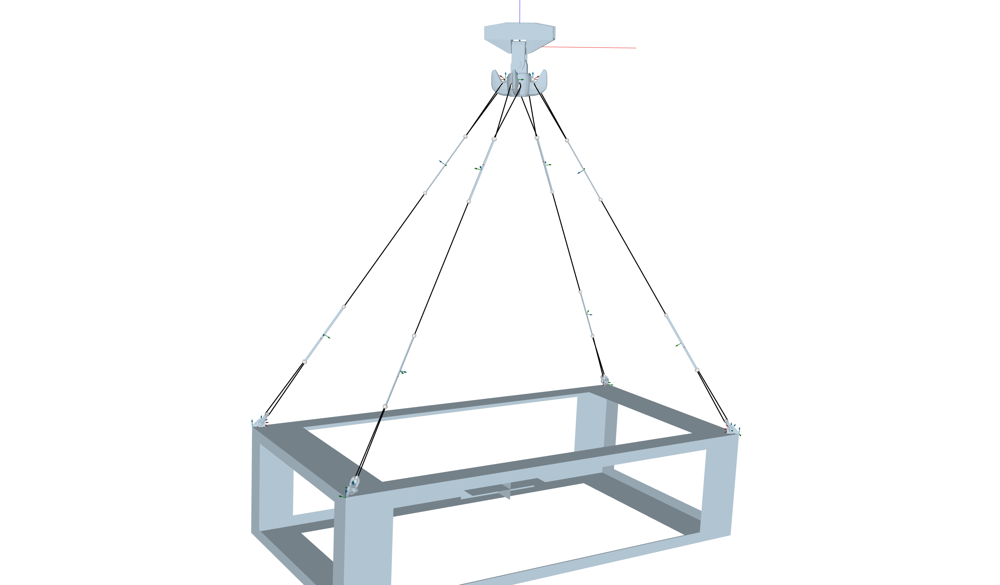

In [16]:
show(s, sea = False, camera_pos = (19.337780692157132, -95.66259086435448, 5.748295880544543), lookat = (-0.49143238579780324, -5.613151552583543, -20.483195850072963), geometry_size = 0.69, force_normalize = True, force_scale = 1.6, cog_scale = 0)

In [18]:
s.save_scene('workflow_4p_lift')

skipping LP1_eye_center 
skipping LP2_eye_center 
skipping LP3_eye_center 
skipping LP4_eye_center 
skipping LP1_eye 
skipping LP2_eye 
skipping LP3_eye 
skipping LP4_eye 
skipping GP800_at_LP1 
skipping GP800_at_LP1pin_poi 
skipping GP800_at_LP1pin 
skipping GP800_at_LP1_connection>>>_master_axis 
skipping GP800_at_LP1_connection>>>_pin_hole_connection 
skipping GP800_at_LP1_connection>>>_slaved_axis 
skipping GP800_at_LP1_connection>>>_connection_axial_rotation 
skipping GP800_at_LP2 
skipping GP800_at_LP2pin_poi 
skipping GP800_at_LP2pin 
skipping GP800_at_LP2_connection>>>_master_axis 
skipping GP800_at_LP2_connection>>>_pin_hole_connection 
skipping GP800_at_LP2_connection>>>_slaved_axis 
skipping GP800_at_LP2_connection>>>_connection_axial_rotation 
skipping GP800_at_LP3 
skipping GP800_at_LP3pin_poi 
skipping GP800_at_LP3pin 
skipping GP800_at_LP3_connection>>>_master_axis 
skipping GP800_at_LP3_connection>>>_pin_hole_connection 
skipping GP800_at_LP3_connection>>>_slaved_axis 


WindowsPath('C:/Users/beneden/DAVE_models/workflow_4p_lift.dave')